# EDA on Wine Quality Data Set

Data source: [University of California Irvine Data Archives](https://archive.ics.uci.edu/ml/datasets/Wine+Quality)

In [1]:
# Set up
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import altair as alt

# Load the R cell magic
%load_ext rpy2.ipython

# import os
# import re
# import sys
# from hashlib import sha1

# from sklearn import datasets
# from sklearn.compose import (
#     ColumnTransformer,
#     TransformedTargetRegressor,
#     make_column_transformer,
# )
# from sklearn.dummy import DummyClassifier, DummyRegressor
# from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
# from sklearn.impute import SimpleImputer
# from sklearn.linear_model import LogisticRegression, Ridge
# from sklearn.metrics import (
#     accuracy_score,
#     classification_report,
#     confusion_matrix,
#     plot_confusion_matrix,
#     f1_score,
#     make_scorer,
#     precision_score,
#     recall_score,
# )
# from sklearn.model_selection import (
#     GridSearchCV,
#     RandomizedSearchCV,
#     cross_validate,
#     train_test_split,
# )
# from sklearn.pipeline import Pipeline, make_pipeline
# from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
# from sklearn.svm import SVC, SVR



C:\Users\truon\miniconda3\envs\wine_quality\lib\site-packages\ipykernel\parentpoller.py:113: UserWarning: Parent poll failed.  If the frontend dies,
                the kernel may be left running.  Please let us know
                about your system (bitness, Python, etc.) at
                ipython-dev@scipy.org
  warnings.warn("""Parent poll failed.  If the frontend dies,
C:\Users\truon\miniconda3\envs\wine_quality\lib\site-packages\rpy2\robjects\packages.py:365: UserWarning: The symbol 'quartz' is not in this R namespace/package.
  warnings.warn(


## Data import

In [2]:
red_wine = pd.read_csv('data/raw/winequality-red.csv', sep = ";")
white_wine = pd.read_csv('data/raw/winequality-white.csv', sep = ";")

## Preprocessing

In [3]:
white_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [4]:
red_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


Base on the brief summary of the data above, there is no missing value, all the features have numeric values, hence there is no major preprocessing needed besides combining the two data set of red wine and white wine to consider wine type (i.e. red or wine) as another possible features that could link to wine quality

In [5]:
white_wine['type'] = 'white'
red_wine['type'] = 'red'
wine_df = pd.concat([white_wine, red_wine], axis = 0)
wine_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,white
1,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,white
2,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,white
3,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,white
4,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,white
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,red
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,red
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,red
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,red


## Univariate Analysis

#### Distribution of wine quality ratings

In [6]:
#Target distritbution plot
alt.data_transformers.disable_max_rows()

alt.Chart(wine_df, title = "Distribution of wine quality").mark_bar().encode(
    alt.X('quality:Q', bin = alt.Bin(maxbins = 50), title = 'Wine quality',
         axis=alt.Axis(values=np.arange(3,10))),
    alt.Y('count():Q'),
    alt.Tooltip('count():Q')
).properties(height = 100)


alt.Chart(...)

It seems wine quality is graded on the scale of 3-9. Although the rating value is numeric values, it seems to serve as discrete ranking categories rather then a continuous scoring scale. Most of the wine are rated as the 5 and 6.

Additionally, the sample size is too smalle for some of the extreme values such as 3,4 or 9. It is maybe useful to group the rating categories to increase each rating's sample size as follows.

In [7]:
conditions = [
    (wine_df['quality'].eq(3) | wine_df['quality'].eq(4)),
    (wine_df['quality'].eq(5) | wine_df['quality'].eq(6)),
    (wine_df['quality'].eq(7) | wine_df['quality'].eq(8) | wine_df['quality'].eq(9))
]

ranks = ['poor','normal','excellent']


wine_df['quality_rank'] = np.select(conditions, ranks) 
# Attribution: https://stackoverflow.com/questions/54653356/case-when-function-from-r-to-python

In [8]:
alt.Chart(wine_df, title = "Distribution of wine quality (regrouped)").mark_bar().encode(
    alt.X('quality_rank:O', title = 'Wine quality rank', sort = ['poor','normal','excellent']),
    alt.Y('count():Q'),
    alt.Tooltip('count():Q')
).properties(width = 300, height = 300)

alt.Chart(...)

#### Distribution of type of wine

In [9]:
alt.Chart(wine_df, title = "Distribution of type of wine").mark_bar().encode(
    alt.Y('type'),
    alt.X('count()'),
    alt.Color('type', legend = None),
    alt.Tooltip('count()')
)

alt.Chart(...)

There are roughly 3 times more white wine than red wine in this data set. So the data is not balanced.

#### Distribution of other numeric features

In [10]:
# Distribution of numeric features in data set

numeric_cols = wine_df.select_dtypes('number').columns.tolist()[:-1]

alt.Chart(wine_df).mark_bar().encode(
    alt.X(alt.repeat('repeat'), type = 'quantitative',
         bin = alt.Bin(maxbins = 50)),
    alt.Y('count()'),
).properties(width = 200, height = 100
).repeat(repeat = numeric_cols, columns = 3)

alt.RepeatChart(...)

Most of the feature distributions above are right-skewed (exept for probability `pH`).

Distribution of `total_sulfur dioxide` feature are also bi-modal

Features like `residual_sugar`, `density`, or `chlorides` seem have extreme outliers given its distribution is highly right-skewed.

## Bivariate Analysis

#### Correlation matrix

R[write to console]: -- Attaching packages --------------------------------------- tidyverse 1.3.0 --

R[write to console]: v ggplot2 3.3.2     v purrr   0.3.4
v tibble  3.0.4     v dplyr   1.0.2
v tidyr   1.1.2     v stringr 1.4.0
v readr   1.4.0     v forcats 0.5.0

R[write to console]: -- Conflicts ------------------------------------------ tidyverse_conflicts() --
x dplyr::filter() masks stats::filter()
x dplyr::lag()    masks stats::lag()

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



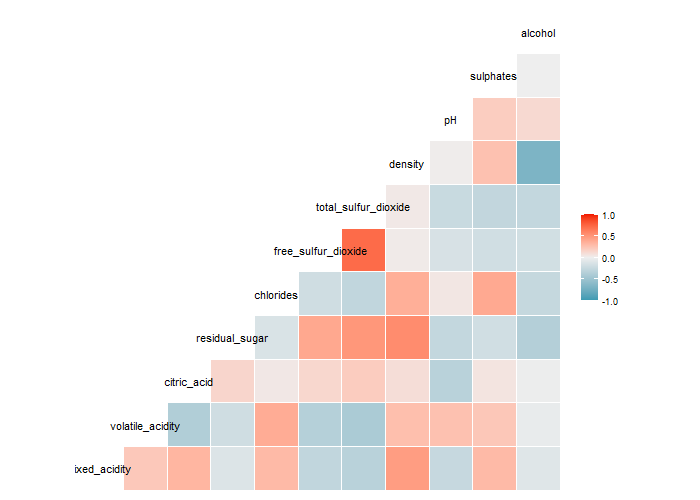

In [11]:
%%R -i wine_df -h 500 -w 700

library(rjson)
library(tidyverse)

# Correlation matrix between numeric features

numeric_cols <- wine_df %>%
    select(-quality) %>%
    select_if(is.numeric) %>%
    colnames()
    

GGally::ggcorr(wine_df %>% select(all_of(numeric_cols)))

We noticed that there is very high positive correlation between `free_sulfur_dioxide` and `total_sulfur_dioxide`, which make sense.

`density` is positively correlated with `chlorides`, `residual_sugar`, `volatile_acidity`, `fixed_acidity`, but is negatively correlated with `alcohol` level, which seems to suggest that high density wine has less acohol content.


`residual_sugar` also seems to have strong positive relation with `free_sulfur_dioxide`, `total_sulfur_dioxide` level and `density`


We can explore these relationship further in the scattered plot between these pairs of features as well as their relationships with the target `quality`

In [12]:
# num_facet = alt.Chart(wine_df).mark_point(size =2, opacity = 0.2).encode(
#     alt.X(alt.repeat('row'), type='quantitative', scale = alt.Scale(zero = False)),
#     alt.Y(alt.repeat('column'), type='quantitative', scale = alt.Scale(zero = False))
# ).properties(width = 50, height = 50
# ).repeat(column = numeric_cols, row = numeric_cols
# ).configure_axis(labels=False)

# num_facet

#### Pairwise relationship

In [13]:
density_rels = ['chlorides', 'residual sugar', 'volatile acidity', 'fixed acidity', 'alcohol']

density_facet = alt.Chart(wine_df).mark_point(size =2, opacity = 0.2).encode(
    alt.X(alt.repeat('row'), type='quantitative', scale = alt.Scale(zero = False)),
    alt.Y(alt.repeat('column'), type='quantitative', scale = alt.Scale(zero = False)),
    alt.Color('type')
).properties(width = 110, height = 110
).repeat(column = density_rels, row = ['density']
).configure_axis(labels=False)

density_facet

alt.RepeatChart(...)

The above chartes seems to confirmed findings from the corelation matrix where `density` is positively correlated with `chlorides`, `residual sugar`, `volatile acidity`, `fixed acidity` and negatively correlted to `alcohol`. These correlations seems to be comparables between red wine and white wine as the data clouds of the respective wine type seem to overlap in most plots, saving for `residual sugar`. This is also understand about give white wine seems to be more tangy than red wine.

We also notice that `residual sugar` seems to have noticable positive association with `sulfur dioxide` level. Let's further explore this relation ship with the plot below by wine type.

In [14]:
sugar_rels = ['total sulfur dioxide','free sulfur dioxide']

sugar_facet = alt.Chart(wine_df).mark_point(size =2, opacity = 0.2).encode(
    alt.X(alt.repeat('row'), type='quantitative', scale = alt.Scale(zero = False)),
    alt.Y(alt.repeat('column'), type='quantitative', scale = alt.Scale(zero = False)),
    alt.Color('type')
).properties(width = 250, height = 250
).repeat(column = sugar_rels, row = ['residual sugar'])

sugar_facet
         
# alt.Chart(wine_df).mark_point(opacity = 0.2).encode(
#     alt.X('residual sugar'),
#     alt.Y('free sulfur dioxide'),
#     alt.Color('type')
# )

alt.RepeatChart(...)

An interesting trend here is that the positive relationship between `residual sugar` and `sulfur dioxide` level seems more pronounced for white wine rather than red wine. For red wine, across different sulfur dioxide levels, the residual sugar levels remain within the range from 0-10.

#### Relationship between features and wine quality

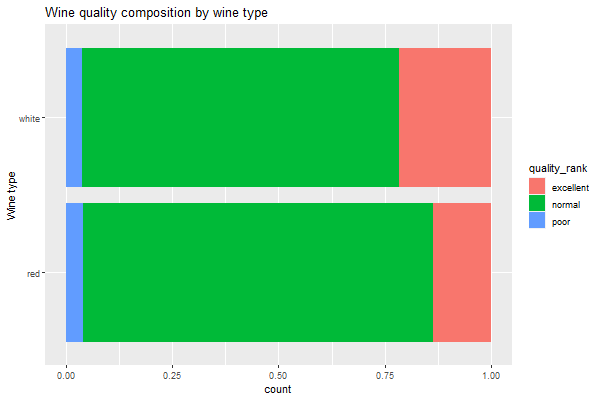

In [15]:
%%R -w 600 -h 400

# Wine type vs wine quality rank
wine_df %>% 
     ggplot(aes(y=type, fill = quality_rank)) +
     geom_bar(stat = "count", position = "fill") +
        labs(title = 'Wine quality composition by wine type',
            y = "Wine type")

There seems to be more excellent white wines

In [17]:
alt.Chart(wine_df).mark_boxplot().encode(
    alt.Y('quality_rank'),
    alt.X(alt.repeat('repeat'), type = 'quantitative', scale = alt.Scale(zero = False)), 
    alt.Color('quality_rank')
).properties(width = 200, height = 100
).repeat(repeat = numeric_cols, columns = 3)

alt.RepeatChart(...)

The `alcohol` level for excellent wine seems to be noticeably higher than that of normal or poor wine.

Excellent wine also lower `density` than lower-quality wine. This agrees with our earlier correlation analysis between the features.

Better ranked wine also seem to have higher `free sulfur dioxide` level than poor wine though the relationship is not that clear based on the boxplot.

High `volatile acidility` also seems to be indicative of better wine.

`citrid acid` level for excelent wine only restrict within the 0.0-0.8 range.

## Summary of Insights from EDA

After the EDA, we see that wine quality ranking seems to be more likely to associate with `volatile acidity`, `citric acid`, `free sulfur dioxide`, `density`, `alcohol`. Hence a multivariate linear classification could be appropriate to estimate the impact each features have on wine quality ranking.

We also note that `density` and `alcohol` are highly negatively correlated. We might pick either element to put in our model. There is also smaller correlation among the above-mentioned variables that we should take note of when conducting our research method and model subsequently.